## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook. 

In [1]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
import xgboost as xgb

sns.set()

In [3]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

In [4]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [5]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

---

## Cargar y preparar los datos.

In [2]:
df = pd.read_csv("../../Datasets/Datos_durante_pandemia/data_durante_vol_ve.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos,TRM,Precio Interno
0,2020-01-01,1.289946,3277.14,975000.0
1,2020-01-02,0.735046,3277.14,945000.0
2,2020-01-03,0.591834,3258.84,940000.0
3,2020-01-04,1.367154,3262.05,930000.0
4,2020-01-05,1.505321,3262.05,920000.0
...,...,...,...,...
913,2022-07-02,0.778572,4198.77,2270000.0
914,2022-07-03,0.819483,4198.77,2270000.0
915,2022-07-04,0.843804,4198.77,2270000.0
916,2022-07-05,0.850985,4198.77,2280000.0


---

## Desarrollo del modelo

In [7]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [8]:
df_stats=df

In [9]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [10]:
def Model(df_data,df_label,lag,estimators):
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    df_label=df_label[lag:]
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    
   
    #make model
    model=xgb.XGBRegressor(n_estimators=estimators
                        ,early_stopping_rounds=80)
    #fit the model with the train data
    
    history=model.fit(df_train,df_train_y_normalize,
          eval_set=[(df_train,df_train_y_normalize),(df_test,df_test_y_normalize)])
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)
    
    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeXGBoost":["train"]*len(trainPredict.flatten()),"XGBoost" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeXGBoost":["test"]*len(testPredict.flatten()),"XGBoost":testPredict.flatten()}]
   
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

[0]	validation_0-rmse:0.99115	validation_1-rmse:1.13015
[1]	validation_0-rmse:0.88991	validation_1-rmse:1.41288
[2]	validation_0-rmse:0.82479	validation_1-rmse:1.70773
[3]	validation_0-rmse:0.76753	validation_1-rmse:1.77149
[4]	validation_0-rmse:0.71361	validation_1-rmse:1.78968
[5]	validation_0-rmse:0.68350	validation_1-rmse:1.87877
[6]	validation_0-rmse:0.65847	validation_1-rmse:2.01568
[7]	validation_0-rmse:0.64011	validation_1-rmse:2.01044
[8]	validation_0-rmse:0.62146	validation_1-rmse:2.14204
[9]	validation_0-rmse:0.59799	validation_1-rmse:2.14678
[10]	validation_0-rmse:0.57253	validation_1-rmse:2.15575
[11]	validation_0-rmse:0.55872	validation_1-rmse:2.20933
[12]	validation_0-rmse:0.53553	validation_1-rmse:2.20909
[13]	validation_0-rmse:0.52546	validation_1-rmse:2.25745
[14]	validation_0-rmse:0.51271	validation_1-rmse:2.33203
[15]	validation_0-rmse:0.50473	validation_1-rmse:2.33200
[16]	validation_0-rmse:0.49474	validation_1-rmse:2.33447
[17]	validation_0-rmse:0.47419	validation

[24]	validation_0-rmse:0.38029	validation_1-rmse:2.37093
[25]	validation_0-rmse:0.35843	validation_1-rmse:2.37335
[26]	validation_0-rmse:0.34209	validation_1-rmse:2.37523
[27]	validation_0-rmse:0.33634	validation_1-rmse:2.37636
[28]	validation_0-rmse:0.32561	validation_1-rmse:2.35549
[29]	validation_0-rmse:0.31582	validation_1-rmse:2.35370
[30]	validation_0-rmse:0.30213	validation_1-rmse:2.35320
[31]	validation_0-rmse:0.29021	validation_1-rmse:2.35535
[32]	validation_0-rmse:0.28233	validation_1-rmse:2.35816
[33]	validation_0-rmse:0.27565	validation_1-rmse:2.35149
[34]	validation_0-rmse:0.26651	validation_1-rmse:2.35612
[35]	validation_0-rmse:0.24927	validation_1-rmse:2.35264
[36]	validation_0-rmse:0.24397	validation_1-rmse:2.34357
[37]	validation_0-rmse:0.23644	validation_1-rmse:2.35083
[38]	validation_0-rmse:0.22529	validation_1-rmse:2.34668
[39]	validation_0-rmse:0.20904	validation_1-rmse:2.34398
[40]	validation_0-rmse:0.19612	validation_1-rmse:2.34470
[41]	validation_0-rmse:0.19611	

[7]	validation_0-rmse:0.64011	validation_1-rmse:2.01044
[8]	validation_0-rmse:0.62146	validation_1-rmse:2.14204
[9]	validation_0-rmse:0.59799	validation_1-rmse:2.14678
[10]	validation_0-rmse:0.57253	validation_1-rmse:2.15575
[11]	validation_0-rmse:0.55872	validation_1-rmse:2.20933
[12]	validation_0-rmse:0.53553	validation_1-rmse:2.20909
[13]	validation_0-rmse:0.52546	validation_1-rmse:2.25745
[14]	validation_0-rmse:0.51271	validation_1-rmse:2.33203
[15]	validation_0-rmse:0.50473	validation_1-rmse:2.33200
[16]	validation_0-rmse:0.49474	validation_1-rmse:2.33447
[17]	validation_0-rmse:0.47419	validation_1-rmse:2.34713
[18]	validation_0-rmse:0.46092	validation_1-rmse:2.34647
[19]	validation_0-rmse:0.45076	validation_1-rmse:2.34737
[20]	validation_0-rmse:0.43258	validation_1-rmse:2.35085
[21]	validation_0-rmse:0.42067	validation_1-rmse:2.35761
[22]	validation_0-rmse:0.40672	validation_1-rmse:2.36931
[23]	validation_0-rmse:0.38569	validation_1-rmse:2.37053
[24]	validation_0-rmse:0.38029	val

[65]	validation_0-rmse:0.17362	validation_1-rmse:2.35107
[66]	validation_0-rmse:0.17362	validation_1-rmse:2.35106
[67]	validation_0-rmse:0.17362	validation_1-rmse:2.35105
[68]	validation_0-rmse:0.17362	validation_1-rmse:2.35105
[69]	validation_0-rmse:0.17362	validation_1-rmse:2.35104
[70]	validation_0-rmse:0.17362	validation_1-rmse:2.35104
[71]	validation_0-rmse:0.17362	validation_1-rmse:2.35104
[72]	validation_0-rmse:0.16986	validation_1-rmse:2.34879
[73]	validation_0-rmse:0.16241	validation_1-rmse:2.34928
[74]	validation_0-rmse:0.15719	validation_1-rmse:2.34537
[75]	validation_0-rmse:0.15031	validation_1-rmse:2.34571
[76]	validation_0-rmse:0.14562	validation_1-rmse:2.34654
[77]	validation_0-rmse:0.13861	validation_1-rmse:2.34717
[78]	validation_0-rmse:0.13473	validation_1-rmse:2.34851
[79]	validation_0-rmse:0.12794	validation_1-rmse:2.34997
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.53431759113463
MAE is : 1.0108663554016204
RMSE is : 1.238675740

[37]	validation_0-rmse:0.23644	validation_1-rmse:2.35083
[38]	validation_0-rmse:0.22529	validation_1-rmse:2.34668
[39]	validation_0-rmse:0.20904	validation_1-rmse:2.34398
[40]	validation_0-rmse:0.19612	validation_1-rmse:2.34470
[41]	validation_0-rmse:0.19611	validation_1-rmse:2.34482
[42]	validation_0-rmse:0.19611	validation_1-rmse:2.34490
[43]	validation_0-rmse:0.19442	validation_1-rmse:2.35055
[44]	validation_0-rmse:0.18451	validation_1-rmse:2.35234
[45]	validation_0-rmse:0.18451	validation_1-rmse:2.35237
[46]	validation_0-rmse:0.18450	validation_1-rmse:2.35239
[47]	validation_0-rmse:0.18450	validation_1-rmse:2.35239
[48]	validation_0-rmse:0.18450	validation_1-rmse:2.35238
[49]	validation_0-rmse:0.18450	validation_1-rmse:2.35237
[50]	validation_0-rmse:0.17768	validation_1-rmse:2.35235
[51]	validation_0-rmse:0.17768	validation_1-rmse:2.35237
[52]	validation_0-rmse:0.17768	validation_1-rmse:2.35238
[53]	validation_0-rmse:0.17363	validation_1-rmse:2.35133
[54]	validation_0-rmse:0.17363	

[40]	validation_0-rmse:0.18152	validation_1-rmse:2.69587
[41]	validation_0-rmse:0.16687	validation_1-rmse:2.69649
[42]	validation_0-rmse:0.15831	validation_1-rmse:2.69685
[43]	validation_0-rmse:0.15438	validation_1-rmse:2.69784
[44]	validation_0-rmse:0.14487	validation_1-rmse:2.69994
[45]	validation_0-rmse:0.13571	validation_1-rmse:2.70298
[46]	validation_0-rmse:0.12803	validation_1-rmse:2.70508
[47]	validation_0-rmse:0.12615	validation_1-rmse:2.70000
[48]	validation_0-rmse:0.12261	validation_1-rmse:2.69859
[49]	validation_0-rmse:0.12058	validation_1-rmse:2.69842
[50]	validation_0-rmse:0.11733	validation_1-rmse:2.69901
[51]	validation_0-rmse:0.11236	validation_1-rmse:2.70069
[52]	validation_0-rmse:0.10813	validation_1-rmse:2.70069
[53]	validation_0-rmse:0.10346	validation_1-rmse:2.70017
[54]	validation_0-rmse:0.09961	validation_1-rmse:2.69972
[55]	validation_0-rmse:0.09438	validation_1-rmse:2.69904
[56]	validation_0-rmse:0.09075	validation_1-rmse:2.69854
[57]	validation_0-rmse:0.08888	

<ipython-input-10-f7487097fa4e>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


[0]	validation_0-rmse:0.98912	validation_1-rmse:1.14727
[1]	validation_0-rmse:0.88547	validation_1-rmse:1.42168
[2]	validation_0-rmse:0.81555	validation_1-rmse:1.85004
[3]	validation_0-rmse:0.77000	validation_1-rmse:2.26323
[4]	validation_0-rmse:0.71140	validation_1-rmse:2.24153
[5]	validation_0-rmse:0.66273	validation_1-rmse:2.23965
[6]	validation_0-rmse:0.63584	validation_1-rmse:2.29199
[7]	validation_0-rmse:0.58824	validation_1-rmse:2.32201
[8]	validation_0-rmse:0.57213	validation_1-rmse:2.32624
[9]	validation_0-rmse:0.54441	validation_1-rmse:2.32242
[10]	validation_0-rmse:0.51698	validation_1-rmse:2.33994
[11]	validation_0-rmse:0.49264	validation_1-rmse:2.33912
[12]	validation_0-rmse:0.48395	validation_1-rmse:2.35066
[13]	validation_0-rmse:0.46360	validation_1-rmse:2.46178
[14]	validation_0-rmse:0.45769	validation_1-rmse:2.46407
[15]	validation_0-rmse:0.43693	validation_1-rmse:2.46415
[16]	validation_0-rmse:0.41029	validation_1-rmse:2.56030
[17]	validation_0-rmse:0.38641	validation

[59]	validation_0-rmse:0.08130	validation_1-rmse:2.69751
[60]	validation_0-rmse:0.08051	validation_1-rmse:2.69789
[61]	validation_0-rmse:0.07939	validation_1-rmse:2.69445
[62]	validation_0-rmse:0.07706	validation_1-rmse:2.69306
[63]	validation_0-rmse:0.07304	validation_1-rmse:2.69250
[64]	validation_0-rmse:0.06884	validation_1-rmse:2.69208
[65]	validation_0-rmse:0.06602	validation_1-rmse:2.69221
[66]	validation_0-rmse:0.06492	validation_1-rmse:2.69222
[67]	validation_0-rmse:0.06162	validation_1-rmse:2.68902
[68]	validation_0-rmse:0.05926	validation_1-rmse:2.68854
[69]	validation_0-rmse:0.05548	validation_1-rmse:2.69101
[70]	validation_0-rmse:0.05316	validation_1-rmse:2.69115
[71]	validation_0-rmse:0.04986	validation_1-rmse:2.69087
[72]	validation_0-rmse:0.04832	validation_1-rmse:2.69162
[73]	validation_0-rmse:0.04501	validation_1-rmse:2.69090
[74]	validation_0-rmse:0.04345	validation_1-rmse:2.69198
[75]	validation_0-rmse:0.04192	validation_1-rmse:2.69164
[76]	validation_0-rmse:0.04048	

[31]	validation_0-rmse:0.23883	validation_1-rmse:2.65483
[32]	validation_0-rmse:0.23142	validation_1-rmse:2.66018
[33]	validation_0-rmse:0.22899	validation_1-rmse:2.65720
[34]	validation_0-rmse:0.22725	validation_1-rmse:2.69933
[35]	validation_0-rmse:0.21878	validation_1-rmse:2.69850
[36]	validation_0-rmse:0.21272	validation_1-rmse:2.69830
[37]	validation_0-rmse:0.21010	validation_1-rmse:2.69125
[38]	validation_0-rmse:0.20107	validation_1-rmse:2.69153
[39]	validation_0-rmse:0.18752	validation_1-rmse:2.69493
[40]	validation_0-rmse:0.18152	validation_1-rmse:2.69587
[41]	validation_0-rmse:0.16687	validation_1-rmse:2.69649
[42]	validation_0-rmse:0.15831	validation_1-rmse:2.69685
[43]	validation_0-rmse:0.15438	validation_1-rmse:2.69784
[44]	validation_0-rmse:0.14487	validation_1-rmse:2.69994
[45]	validation_0-rmse:0.13571	validation_1-rmse:2.70298
[46]	validation_0-rmse:0.12803	validation_1-rmse:2.70508
[47]	validation_0-rmse:0.12615	validation_1-rmse:2.70000
[48]	validation_0-rmse:0.12261	

[2]	validation_0-rmse:0.80398	validation_1-rmse:2.33188
[3]	validation_0-rmse:0.72925	validation_1-rmse:2.33935
[4]	validation_0-rmse:0.69664	validation_1-rmse:2.32751
[5]	validation_0-rmse:0.65714	validation_1-rmse:2.60337
[6]	validation_0-rmse:0.64115	validation_1-rmse:2.70415
[7]	validation_0-rmse:0.62521	validation_1-rmse:2.75737
[8]	validation_0-rmse:0.60660	validation_1-rmse:2.73438
[9]	validation_0-rmse:0.58194	validation_1-rmse:2.82832
[10]	validation_0-rmse:0.55406	validation_1-rmse:2.82423
[11]	validation_0-rmse:0.54422	validation_1-rmse:2.80057
[12]	validation_0-rmse:0.52101	validation_1-rmse:2.80426
[13]	validation_0-rmse:0.47576	validation_1-rmse:2.79488
[14]	validation_0-rmse:0.44411	validation_1-rmse:2.79879
[15]	validation_0-rmse:0.42791	validation_1-rmse:2.76769
[16]	validation_0-rmse:0.40691	validation_1-rmse:2.77030
[17]	validation_0-rmse:0.39814	validation_1-rmse:2.76928
[18]	validation_0-rmse:0.37436	validation_1-rmse:2.76757
[19]	validation_0-rmse:0.35452	validati

[25]	validation_0-rmse:0.25246	validation_1-rmse:2.84262
[26]	validation_0-rmse:0.24187	validation_1-rmse:2.85238
[27]	validation_0-rmse:0.22820	validation_1-rmse:2.85314
[28]	validation_0-rmse:0.22360	validation_1-rmse:2.85281
[29]	validation_0-rmse:0.21654	validation_1-rmse:2.84986
[30]	validation_0-rmse:0.20951	validation_1-rmse:2.85507
[31]	validation_0-rmse:0.20115	validation_1-rmse:2.85114
[32]	validation_0-rmse:0.19055	validation_1-rmse:2.85484
[33]	validation_0-rmse:0.18311	validation_1-rmse:2.85263
[34]	validation_0-rmse:0.17355	validation_1-rmse:2.84121
[35]	validation_0-rmse:0.15940	validation_1-rmse:2.84215
[36]	validation_0-rmse:0.15564	validation_1-rmse:2.84203
[37]	validation_0-rmse:0.14799	validation_1-rmse:2.84963
[38]	validation_0-rmse:0.14330	validation_1-rmse:2.85053
[39]	validation_0-rmse:0.13306	validation_1-rmse:2.84118
[40]	validation_0-rmse:0.11902	validation_1-rmse:2.84397
[41]	validation_0-rmse:0.11372	validation_1-rmse:2.84459
[42]	validation_0-rmse:0.11153	

[8]	validation_0-rmse:0.60660	validation_1-rmse:2.73438
[9]	validation_0-rmse:0.58194	validation_1-rmse:2.82832
[10]	validation_0-rmse:0.55406	validation_1-rmse:2.82423
[11]	validation_0-rmse:0.54422	validation_1-rmse:2.80057
[12]	validation_0-rmse:0.52101	validation_1-rmse:2.80426
[13]	validation_0-rmse:0.47576	validation_1-rmse:2.79488
[14]	validation_0-rmse:0.44411	validation_1-rmse:2.79879
[15]	validation_0-rmse:0.42791	validation_1-rmse:2.76769
[16]	validation_0-rmse:0.40691	validation_1-rmse:2.77030
[17]	validation_0-rmse:0.39814	validation_1-rmse:2.76928
[18]	validation_0-rmse:0.37436	validation_1-rmse:2.76757
[19]	validation_0-rmse:0.35452	validation_1-rmse:2.77380
[20]	validation_0-rmse:0.34556	validation_1-rmse:2.77858
[21]	validation_0-rmse:0.31127	validation_1-rmse:2.78133
[22]	validation_0-rmse:0.30117	validation_1-rmse:2.78026
[23]	validation_0-rmse:0.26920	validation_1-rmse:2.77076
[24]	validation_0-rmse:0.25657	validation_1-rmse:2.77539
[25]	validation_0-rmse:0.25246	va

[38]	validation_0-rmse:0.14330	validation_1-rmse:2.85053
[39]	validation_0-rmse:0.13306	validation_1-rmse:2.84118
[40]	validation_0-rmse:0.11902	validation_1-rmse:2.84397
[41]	validation_0-rmse:0.11372	validation_1-rmse:2.84459
[42]	validation_0-rmse:0.11153	validation_1-rmse:2.84435
[43]	validation_0-rmse:0.10700	validation_1-rmse:2.84472
[44]	validation_0-rmse:0.10415	validation_1-rmse:2.84377
[45]	validation_0-rmse:0.10305	validation_1-rmse:2.85745
[46]	validation_0-rmse:0.09855	validation_1-rmse:2.85052
[47]	validation_0-rmse:0.08990	validation_1-rmse:2.85251
[48]	validation_0-rmse:0.08444	validation_1-rmse:2.85375
[49]	validation_0-rmse:0.08157	validation_1-rmse:2.85209
[50]	validation_0-rmse:0.07707	validation_1-rmse:2.85210
[51]	validation_0-rmse:0.07612	validation_1-rmse:2.85341
[52]	validation_0-rmse:0.07453	validation_1-rmse:2.85432
[53]	validation_0-rmse:0.07248	validation_1-rmse:2.85427
[54]	validation_0-rmse:0.06768	validation_1-rmse:2.85475
[55]	validation_0-rmse:0.06590	

[40]	validation_0-rmse:0.11780	validation_1-rmse:1.83951
[41]	validation_0-rmse:0.11403	validation_1-rmse:1.82941
[42]	validation_0-rmse:0.10973	validation_1-rmse:1.81858
[43]	validation_0-rmse:0.10740	validation_1-rmse:1.81851
[44]	validation_0-rmse:0.10337	validation_1-rmse:1.81666
[45]	validation_0-rmse:0.09865	validation_1-rmse:1.81830
[46]	validation_0-rmse:0.09401	validation_1-rmse:1.81728
[47]	validation_0-rmse:0.08948	validation_1-rmse:1.81658
[48]	validation_0-rmse:0.08784	validation_1-rmse:1.81365
[49]	validation_0-rmse:0.08604	validation_1-rmse:1.81589
[50]	validation_0-rmse:0.08429	validation_1-rmse:1.81623
[51]	validation_0-rmse:0.08258	validation_1-rmse:1.81584
[52]	validation_0-rmse:0.07779	validation_1-rmse:1.81641
[53]	validation_0-rmse:0.07619	validation_1-rmse:1.81844
[54]	validation_0-rmse:0.07307	validation_1-rmse:1.81794
[55]	validation_0-rmse:0.07077	validation_1-rmse:1.81811
[56]	validation_0-rmse:0.06958	validation_1-rmse:1.80419
[57]	validation_0-rmse:0.06601	

[43]	validation_0-rmse:0.10740	validation_1-rmse:1.81851
[44]	validation_0-rmse:0.10337	validation_1-rmse:1.81666
[45]	validation_0-rmse:0.09865	validation_1-rmse:1.81830
[46]	validation_0-rmse:0.09401	validation_1-rmse:1.81728
[47]	validation_0-rmse:0.08948	validation_1-rmse:1.81658
[48]	validation_0-rmse:0.08784	validation_1-rmse:1.81365
[49]	validation_0-rmse:0.08604	validation_1-rmse:1.81589
[50]	validation_0-rmse:0.08429	validation_1-rmse:1.81623
[51]	validation_0-rmse:0.08258	validation_1-rmse:1.81584
[52]	validation_0-rmse:0.07779	validation_1-rmse:1.81641
[53]	validation_0-rmse:0.07619	validation_1-rmse:1.81844
[54]	validation_0-rmse:0.07307	validation_1-rmse:1.81794
[55]	validation_0-rmse:0.07077	validation_1-rmse:1.81811
[56]	validation_0-rmse:0.06958	validation_1-rmse:1.80419
[57]	validation_0-rmse:0.06601	validation_1-rmse:1.80380
[58]	validation_0-rmse:0.06144	validation_1-rmse:1.80463
[59]	validation_0-rmse:0.05604	validation_1-rmse:1.80461
[60]	validation_0-rmse:0.05352	

[15]	validation_0-rmse:0.38359	validation_1-rmse:1.78882
[16]	validation_0-rmse:0.37556	validation_1-rmse:1.78737
[17]	validation_0-rmse:0.35318	validation_1-rmse:1.78604
[18]	validation_0-rmse:0.33650	validation_1-rmse:1.78742
[19]	validation_0-rmse:0.32846	validation_1-rmse:1.78606
[20]	validation_0-rmse:0.31421	validation_1-rmse:1.82588
[21]	validation_0-rmse:0.30195	validation_1-rmse:1.82461
[22]	validation_0-rmse:0.29383	validation_1-rmse:1.82465
[23]	validation_0-rmse:0.27785	validation_1-rmse:1.82049
[24]	validation_0-rmse:0.26845	validation_1-rmse:1.85432
[25]	validation_0-rmse:0.25037	validation_1-rmse:1.85435
[26]	validation_0-rmse:0.24258	validation_1-rmse:1.87661
[27]	validation_0-rmse:0.23489	validation_1-rmse:1.87860
[28]	validation_0-rmse:0.21391	validation_1-rmse:1.88052
[29]	validation_0-rmse:0.20582	validation_1-rmse:1.88082
[30]	validation_0-rmse:0.20100	validation_1-rmse:1.83309
[31]	validation_0-rmse:0.19051	validation_1-rmse:1.83382
[32]	validation_0-rmse:0.17713	

[73]	validation_0-rmse:0.03060	validation_1-rmse:1.80300
[74]	validation_0-rmse:0.02898	validation_1-rmse:1.80443
[75]	validation_0-rmse:0.02767	validation_1-rmse:1.80443
[76]	validation_0-rmse:0.02720	validation_1-rmse:1.80894
[77]	validation_0-rmse:0.02667	validation_1-rmse:1.80985
[78]	validation_0-rmse:0.02515	validation_1-rmse:1.80955
[79]	validation_0-rmse:0.02425	validation_1-rmse:1.80965
[80]	validation_0-rmse:0.02397	validation_1-rmse:1.80969
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.5303127258555227
MAE is : 1.004663515608772
RMSE is : 1.237058093161159
MAPE is : 56.75023802194536
Evaluation metric results:
MSE is : 3.2940576559094352
MAE is : 1.6092474729730517
RMSE is : 1.8149538991140892
MAPE is : 94.47455389450421
[0]	validation_0-rmse:0.98862	validation_1-rmse:1.45402
[1]	validation_0-rmse:0.88228	validation_1-rmse:1.87816
[2]	validation_0-rmse:0.80857	validation_1-rmse:1.83913
[3]	validation_0-rmse:0.76284	validation_1-rmse:1.75514

[45]	validation_0-rmse:0.09118	validation_1-rmse:1.85859
[46]	validation_0-rmse:0.09004	validation_1-rmse:1.85858
[47]	validation_0-rmse:0.08318	validation_1-rmse:1.85934
[48]	validation_0-rmse:0.08085	validation_1-rmse:1.86672
[49]	validation_0-rmse:0.07684	validation_1-rmse:1.86906
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.5334720349133584
MAE is : 1.0068432009888413
RMSE is : 1.2383343792826549
MAPE is : 56.89155920094473
Evaluation metric results:
MSE is : 3.270029878481618
MAE is : 1.6011912726448414
RMSE is : 1.808322393402686
MAPE is : 94.06457839841332
[0]	validation_0-rmse:0.98816	validation_1-rmse:1.44870
[1]	validation_0-rmse:0.87930	validation_1-rmse:1.88036
[2]	validation_0-rmse:0.80631	validation_1-rmse:1.83667
[3]	validation_0-rmse:0.73056	validation_1-rmse:1.81235
[4]	validation_0-rmse:0.69264	validation_1-rmse:1.78157
[5]	validation_0-rmse:0.65946	validation_1-rmse:1.77006
[6]	validation_0-rmse:0.61344	validation_1-rmse:1.81000
[7

[50]	validation_0-rmse:0.06946	validation_1-rmse:1.86859
[51]	validation_0-rmse:0.06262	validation_1-rmse:1.87278
[52]	validation_0-rmse:0.05856	validation_1-rmse:1.87391
[53]	validation_0-rmse:0.05639	validation_1-rmse:1.87411
[54]	validation_0-rmse:0.05405	validation_1-rmse:1.87583
[55]	validation_0-rmse:0.04980	validation_1-rmse:1.87629
[56]	validation_0-rmse:0.04561	validation_1-rmse:1.87606
[57]	validation_0-rmse:0.04413	validation_1-rmse:1.87594
[58]	validation_0-rmse:0.04210	validation_1-rmse:1.87561
[59]	validation_0-rmse:0.04033	validation_1-rmse:1.87600
[60]	validation_0-rmse:0.03947	validation_1-rmse:1.87627
[61]	validation_0-rmse:0.03769	validation_1-rmse:1.87616
[62]	validation_0-rmse:0.03542	validation_1-rmse:1.87752
[63]	validation_0-rmse:0.03337	validation_1-rmse:1.87628
[64]	validation_0-rmse:0.03020	validation_1-rmse:1.87655
[65]	validation_0-rmse:0.02860	validation_1-rmse:1.87703
[66]	validation_0-rmse:0.02785	validation_1-rmse:1.87709
[67]	validation_0-rmse:0.02702	

[22]	validation_0-rmse:0.28026	validation_1-rmse:1.77728
[23]	validation_0-rmse:0.26384	validation_1-rmse:1.78112
[24]	validation_0-rmse:0.25884	validation_1-rmse:1.78389
[25]	validation_0-rmse:0.23815	validation_1-rmse:1.78639
[26]	validation_0-rmse:0.23017	validation_1-rmse:1.78892
[27]	validation_0-rmse:0.21567	validation_1-rmse:1.79545
[28]	validation_0-rmse:0.20892	validation_1-rmse:1.79734
[29]	validation_0-rmse:0.19607	validation_1-rmse:1.80242
[30]	validation_0-rmse:0.19037	validation_1-rmse:1.80383
[31]	validation_0-rmse:0.18324	validation_1-rmse:1.80486
[32]	validation_0-rmse:0.17786	validation_1-rmse:1.82530
[33]	validation_0-rmse:0.17433	validation_1-rmse:1.82532
[34]	validation_0-rmse:0.16617	validation_1-rmse:1.84407
[35]	validation_0-rmse:0.15168	validation_1-rmse:1.84040
[36]	validation_0-rmse:0.14083	validation_1-rmse:1.84260
[37]	validation_0-rmse:0.13738	validation_1-rmse:1.85499
[38]	validation_0-rmse:0.13460	validation_1-rmse:1.85557
[39]	validation_0-rmse:0.13010	

len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.5334720349133584
MAE is : 1.0068432009888413
RMSE is : 1.2383343792826549
MAPE is : 56.89155920094473
Evaluation metric results:
MSE is : 3.270029878481618
MAE is : 1.6011912726448414
RMSE is : 1.808322393402686
MAPE is : 94.06457839841332
[0]	validation_0-rmse:0.98289	validation_1-rmse:1.45258
[1]	validation_0-rmse:0.88474	validation_1-rmse:1.87821
[2]	validation_0-rmse:0.79133	validation_1-rmse:1.85280
[3]	validation_0-rmse:0.70078	validation_1-rmse:1.92597
[4]	validation_0-rmse:0.65974	validation_1-rmse:2.19379
[5]	validation_0-rmse:0.60847	validation_1-rmse:2.14860
[6]	validation_0-rmse:0.58637	validation_1-rmse:2.12772
[7]	validation_0-rmse:0.55487	validation_1-rmse:2.14904
[8]	validation_0-rmse:0.52364	validation_1-rmse:2.13924
[9]	validation_0-rmse:0.50194	validation_1-rmse:2.17518
[10]	validation_0-rmse:0.49065	validation_1-rmse:2.15322
[11]	validation_0-rmse:0.47758	validation_1-rmse:2.15797
[12]	

[18]	validation_0-rmse:0.28619	validation_1-rmse:2.11280
[19]	validation_0-rmse:0.27176	validation_1-rmse:2.11341
[20]	validation_0-rmse:0.25850	validation_1-rmse:2.11484
[21]	validation_0-rmse:0.24725	validation_1-rmse:2.11274
[22]	validation_0-rmse:0.23474	validation_1-rmse:2.11241
[23]	validation_0-rmse:0.22702	validation_1-rmse:2.11191
[24]	validation_0-rmse:0.21645	validation_1-rmse:2.11245
[25]	validation_0-rmse:0.21242	validation_1-rmse:2.12040
[26]	validation_0-rmse:0.19939	validation_1-rmse:2.11992
[27]	validation_0-rmse:0.18849	validation_1-rmse:2.11922
[28]	validation_0-rmse:0.18531	validation_1-rmse:2.11922
[29]	validation_0-rmse:0.17418	validation_1-rmse:2.11780
[30]	validation_0-rmse:0.16883	validation_1-rmse:2.16634
[31]	validation_0-rmse:0.15976	validation_1-rmse:2.16792
[32]	validation_0-rmse:0.15565	validation_1-rmse:2.16229
[33]	validation_0-rmse:0.13872	validation_1-rmse:2.16652
[34]	validation_0-rmse:0.13047	validation_1-rmse:2.16567
[35]	validation_0-rmse:0.12342	

[1]	validation_0-rmse:0.88474	validation_1-rmse:1.87821
[2]	validation_0-rmse:0.79133	validation_1-rmse:1.85280
[3]	validation_0-rmse:0.70078	validation_1-rmse:1.92597
[4]	validation_0-rmse:0.65974	validation_1-rmse:2.19379
[5]	validation_0-rmse:0.60847	validation_1-rmse:2.14860
[6]	validation_0-rmse:0.58637	validation_1-rmse:2.12772
[7]	validation_0-rmse:0.55487	validation_1-rmse:2.14904
[8]	validation_0-rmse:0.52364	validation_1-rmse:2.13924
[9]	validation_0-rmse:0.50194	validation_1-rmse:2.17518
[10]	validation_0-rmse:0.49065	validation_1-rmse:2.15322
[11]	validation_0-rmse:0.47758	validation_1-rmse:2.15797
[12]	validation_0-rmse:0.46203	validation_1-rmse:2.15470
[13]	validation_0-rmse:0.44304	validation_1-rmse:2.15602
[14]	validation_0-rmse:0.41472	validation_1-rmse:2.12113
[15]	validation_0-rmse:0.36675	validation_1-rmse:2.12877
[16]	validation_0-rmse:0.33961	validation_1-rmse:2.12706
[17]	validation_0-rmse:0.30598	validation_1-rmse:2.13114
[18]	validation_0-rmse:0.28619	validatio

[60]	validation_0-rmse:0.04170	validation_1-rmse:2.17585
[61]	validation_0-rmse:0.04111	validation_1-rmse:2.17319
[62]	validation_0-rmse:0.04033	validation_1-rmse:2.17356
[63]	validation_0-rmse:0.03862	validation_1-rmse:2.17357
[64]	validation_0-rmse:0.03643	validation_1-rmse:2.17365
[65]	validation_0-rmse:0.03511	validation_1-rmse:2.17427
[66]	validation_0-rmse:0.03408	validation_1-rmse:2.17447
[67]	validation_0-rmse:0.03158	validation_1-rmse:2.17489
[68]	validation_0-rmse:0.03076	validation_1-rmse:2.17523
[69]	validation_0-rmse:0.03015	validation_1-rmse:2.17523
[70]	validation_0-rmse:0.02791	validation_1-rmse:2.17510
[71]	validation_0-rmse:0.02675	validation_1-rmse:2.17596
[72]	validation_0-rmse:0.02589	validation_1-rmse:2.17572
[73]	validation_0-rmse:0.02554	validation_1-rmse:2.17568
[74]	validation_0-rmse:0.02410	validation_1-rmse:2.17532
[75]	validation_0-rmse:0.02323	validation_1-rmse:2.17497
[76]	validation_0-rmse:0.02255	validation_1-rmse:2.17264
[77]	validation_0-rmse:0.02174	

[31]	validation_0-rmse:0.15976	validation_1-rmse:2.16792
[32]	validation_0-rmse:0.15565	validation_1-rmse:2.16229
[33]	validation_0-rmse:0.13872	validation_1-rmse:2.16652
[34]	validation_0-rmse:0.13047	validation_1-rmse:2.16567
[35]	validation_0-rmse:0.12342	validation_1-rmse:2.16667
[36]	validation_0-rmse:0.11936	validation_1-rmse:2.17545
[37]	validation_0-rmse:0.11261	validation_1-rmse:2.17713
[38]	validation_0-rmse:0.10975	validation_1-rmse:2.17832
[39]	validation_0-rmse:0.10526	validation_1-rmse:2.17724
[40]	validation_0-rmse:0.10391	validation_1-rmse:2.17772
[41]	validation_0-rmse:0.10023	validation_1-rmse:2.17719
[42]	validation_0-rmse:0.09414	validation_1-rmse:2.17900
[43]	validation_0-rmse:0.09281	validation_1-rmse:2.17960
[44]	validation_0-rmse:0.08676	validation_1-rmse:2.18065
[45]	validation_0-rmse:0.08134	validation_1-rmse:2.17920
[46]	validation_0-rmse:0.07668	validation_1-rmse:2.17917
[47]	validation_0-rmse:0.07249	validation_1-rmse:2.17816
[48]	validation_0-rmse:0.06860	

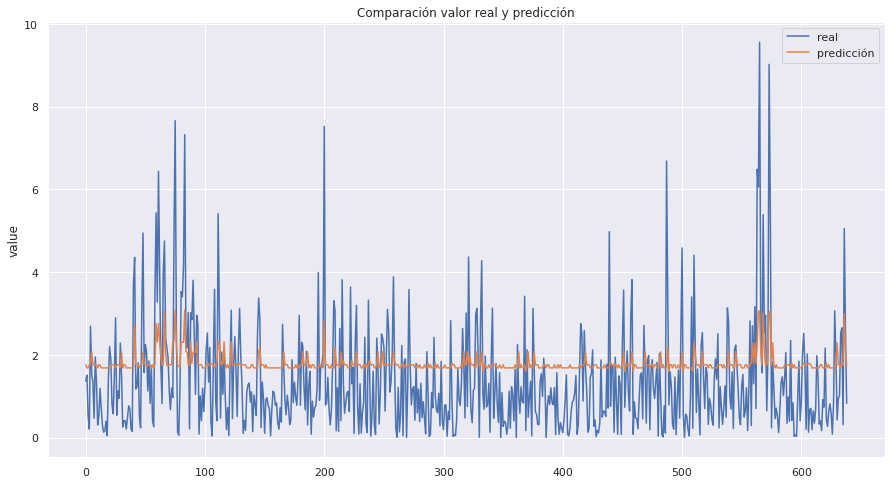

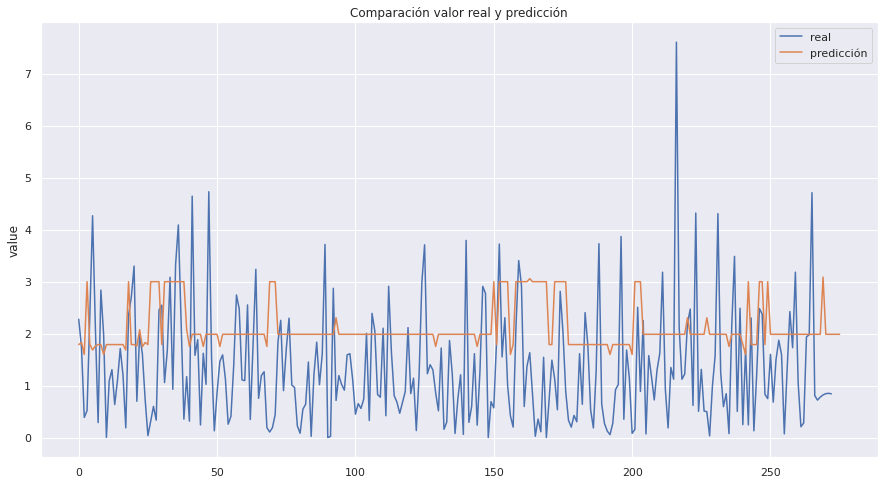

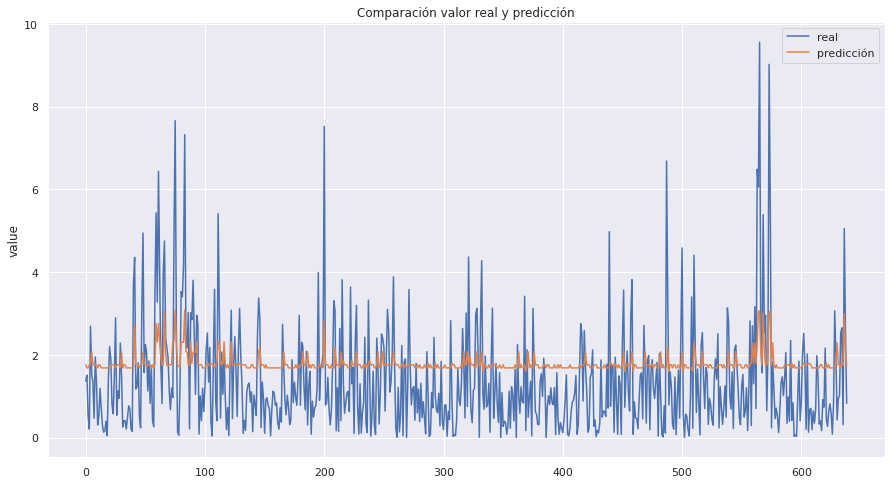

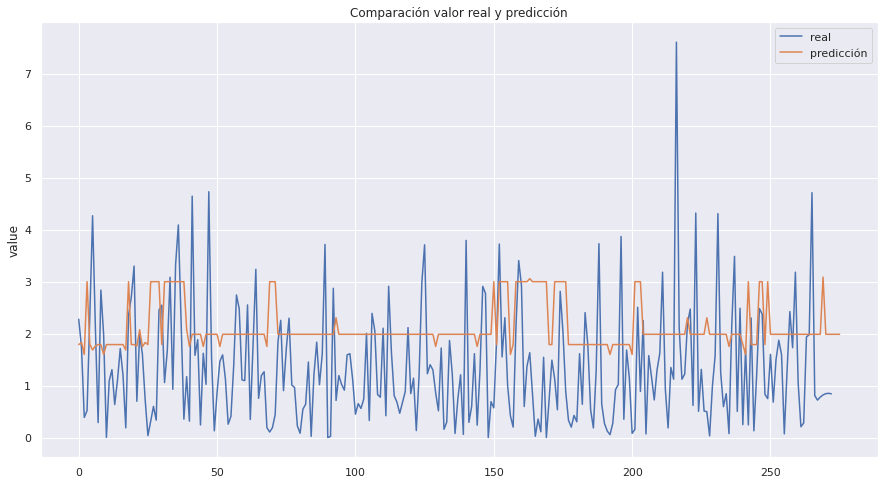

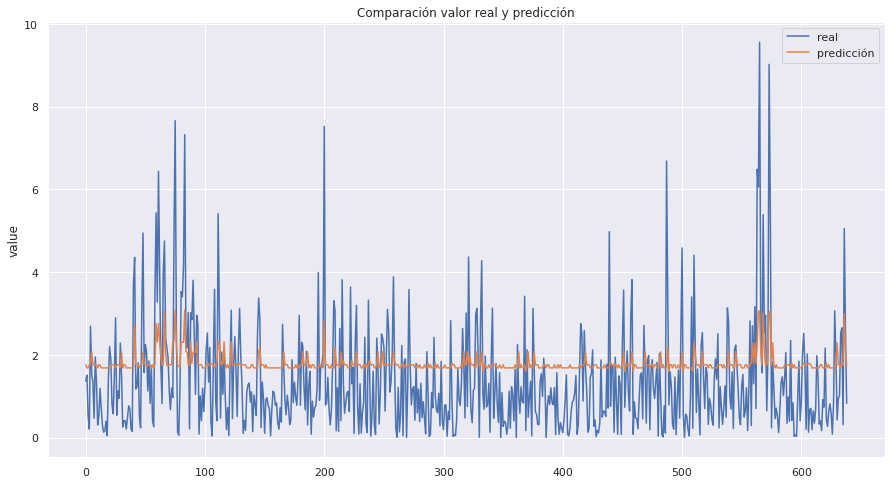

...

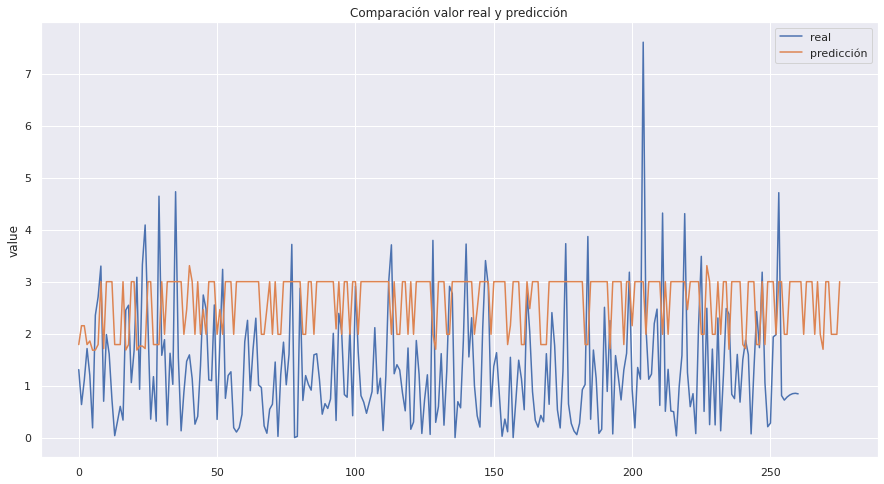

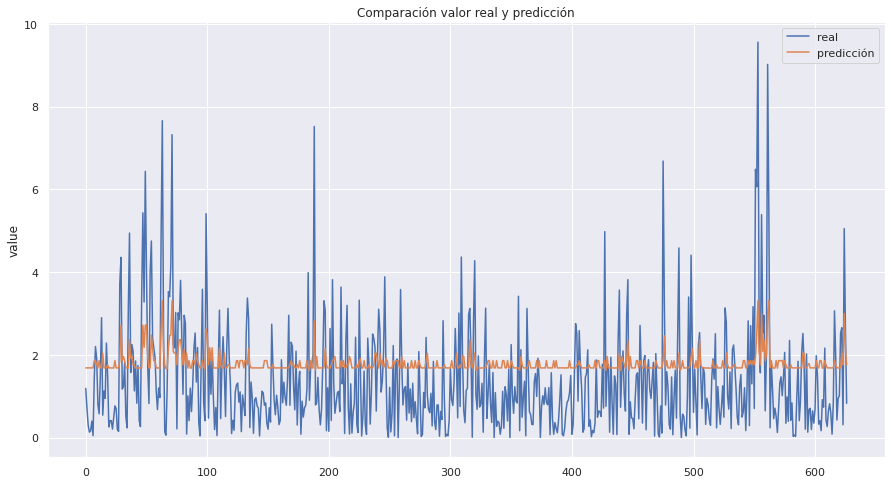

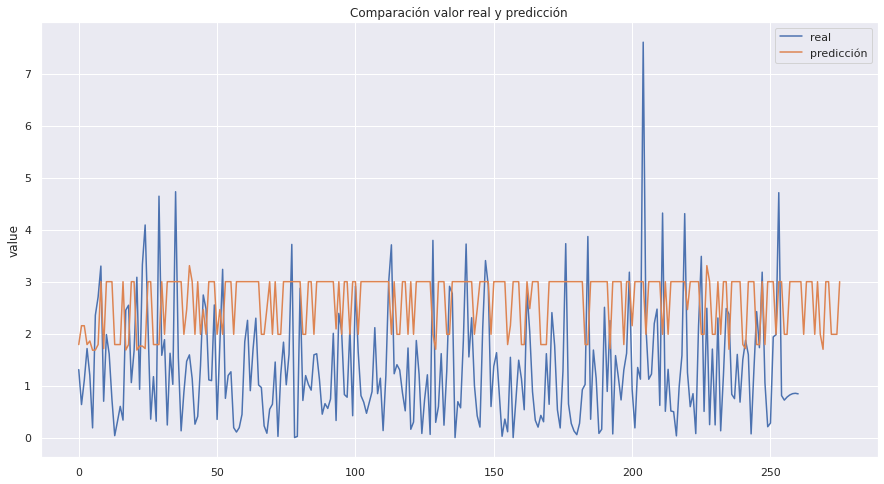

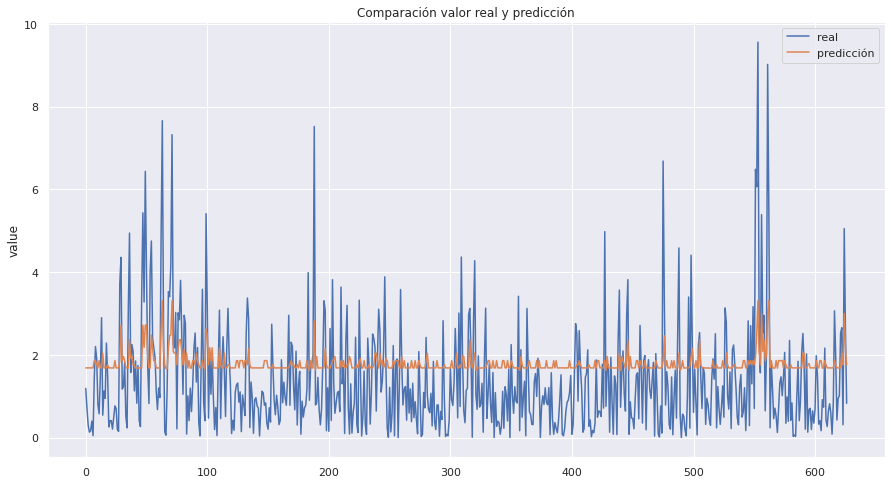

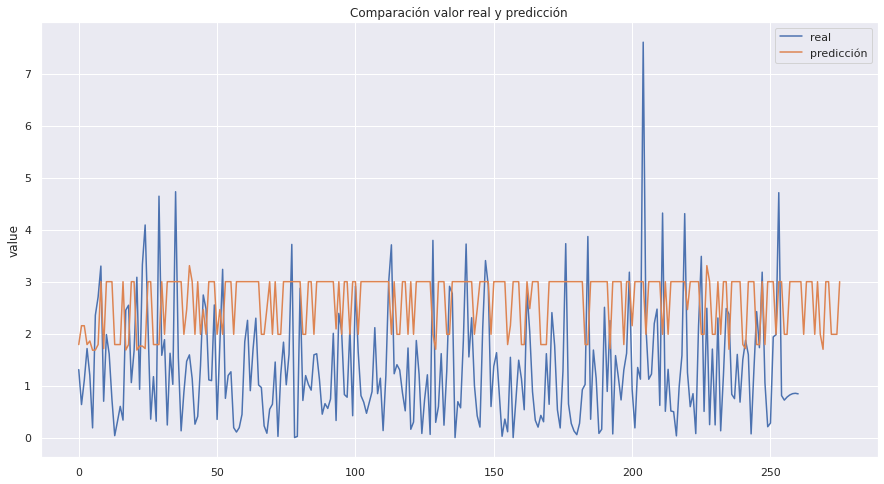

In [17]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(50,100,10)]
n_estimators.extend([200,300,500])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)